## **Assignment 3: Clustering**
### Stefan Dimitrov Velev, 0MI3400521, Big Data Technologies
### Faculty of Mathematics and Informatics, Sofia University

In [1]:
# Import required Python libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN

In [2]:
# Read the given CSV file
df = pd.read_csv('./data/data_assignment3.csv', delimiter=',')

In [3]:
df.head()

,residue name,position,chain,phi,psi
0,LYS,10,A,-149.312855,142.657714
1,PRO,11,A,-44.283210,136.002076
2,LYS,12,A,-119.972621,-168.705263
3,LEU,13,A,-135.317212,137.143523
4,LEU,14,A,-104.851467,95.928520


In [4]:
print("The number of rows in the data frame is:", len(df))

The number of rows in the data frame is: 29369


In [5]:
df = df.dropna()

In [6]:
print("The number of rows in the data frame is:", len(df))

The number of rows in the data frame is: 29369


In [7]:
df.describe()

,position,phi,psi
count,29369.000000,29369.000000,29369.000000
mean,182.917634,-82.362440,64.251961
std,130.180669,56.848421,91.119597
min,1.000000,-179.991175,-179.995255
25%,84.000000,-118.089883,-24.299401
50%,151.000000,-85.198070,110.903019
75%,257.000000,-63.287290,141.154709
max,772.000000,179.973856,179.986259


### **Task 1: Show the distribution of phi and psi combinations using:**

#### ***a. A scatter plot***

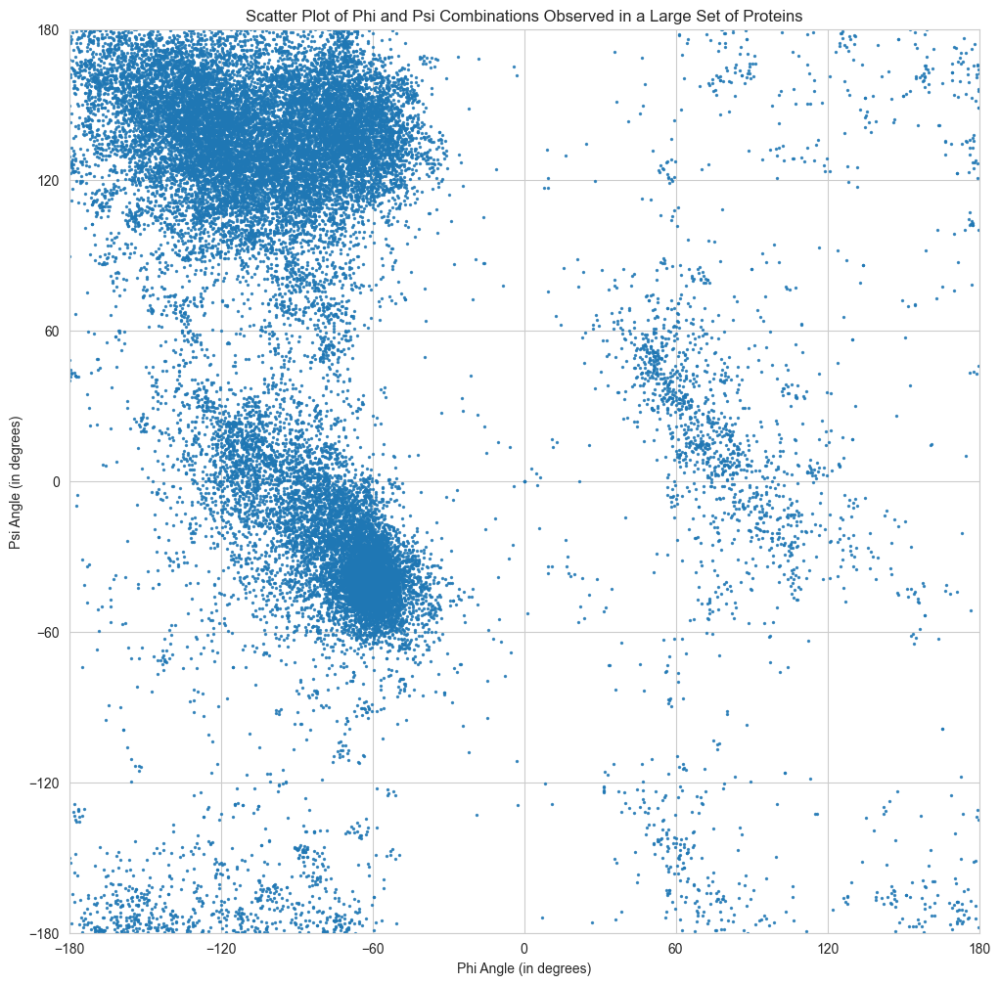

In [8]:
# Draw scatter plot of the data
plt.figure(figsize=(12, 12))
plt.scatter(df['phi'], df['psi'], s=2, alpha=0.8)
plt.xlim(-180, 180)
plt.ylim(-180, 180)
plt.xticks(range(-180, 181, 60))
plt.yticks(range(-180, 181, 60))
plt.xlabel('Phi Angle (in degrees)')
plt.ylabel('Psi Angle (in degrees)')

plt.title('Scatter Plot of Phi and Psi Combinations Observed in a Large Set of Proteins')
plt.show()

#### ***b. A 2D histogram***

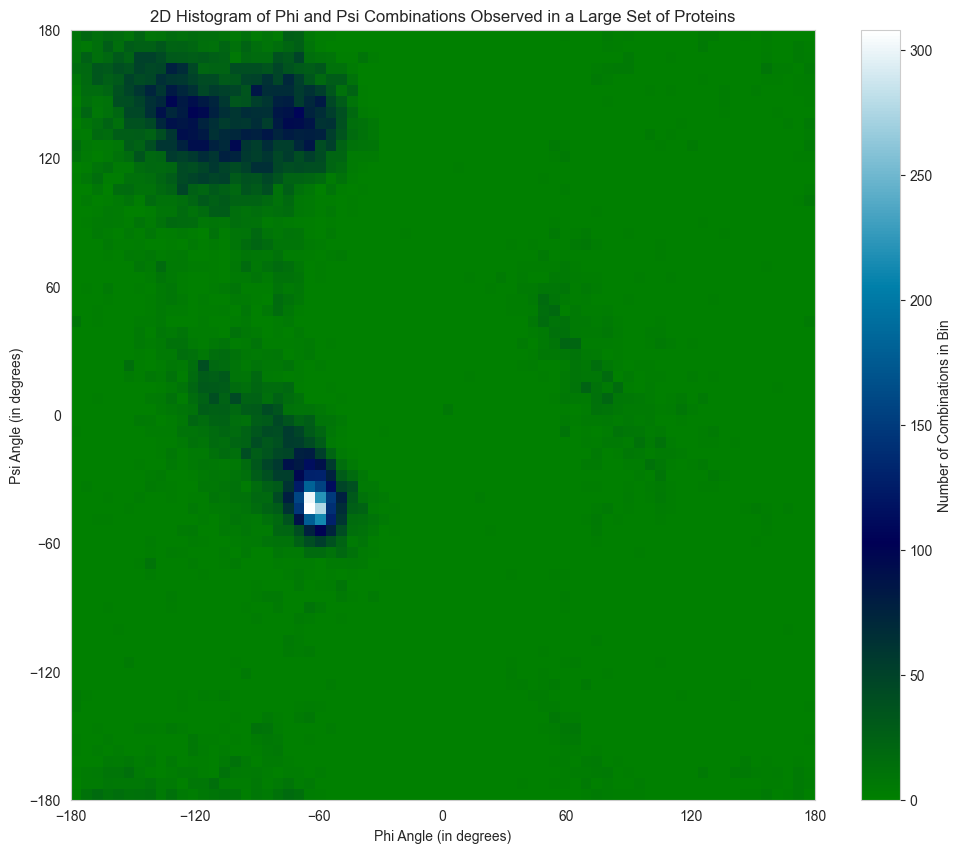

In [9]:
# Draw 2D histogram of the data
plt.figure(figsize=(12, 10))
plt.hist2d(df['phi'], df['psi'], bins=70, cmap='ocean')
plt.xticks(range(-180, 181, 60))
plt.yticks(range(-180, 181, 60))
plt.colorbar(label = "Number of Combinations in Bin")
plt.xlabel('Phi Angle (in degrees)')
plt.ylabel('Psi Angle (in degrees)')
plt.title('2D Histogram of Phi and Psi Combinations Observed in a Large Set of Proteins')
plt.show()

### **Task 2: Use the K-means clustering method to cluster the phi and psi angle combinations in the data file.**

In [10]:
X = df[['phi', 'psi']].copy()

In [11]:
# List that stores the sum of squared distances of samples to their closest cluster center, weighted by the sample weights if given
inertia = []

In [12]:
def visualise_kmeans(k):
    kmeans = KMeans(n_clusters=k, n_init=10)
    kmeans.fit(X)
    y_kmeans = kmeans.predict(X)
    inertia.append(kmeans.inertia_)

    plt.figure(figsize=(9, 9))
    plt.scatter(X['phi'], X['psi'], c=y_kmeans, s=2, alpha=0.8, cmap='viridis')
    plt.xlim(-180, 180)
    plt.ylim(-180, 180)
    plt.xticks(range(-180, 181, 60))
    plt.yticks(range(-180, 181, 60))
    plt.xlabel('Phi Angle (in degrees)')
    plt.ylabel('Psi Angle (in degrees)')

    plt.title(f'KMeans Clustering with k = {k} on Phi and Psi Combinations Observed in a Large Set of Proteins')
    plt.show()

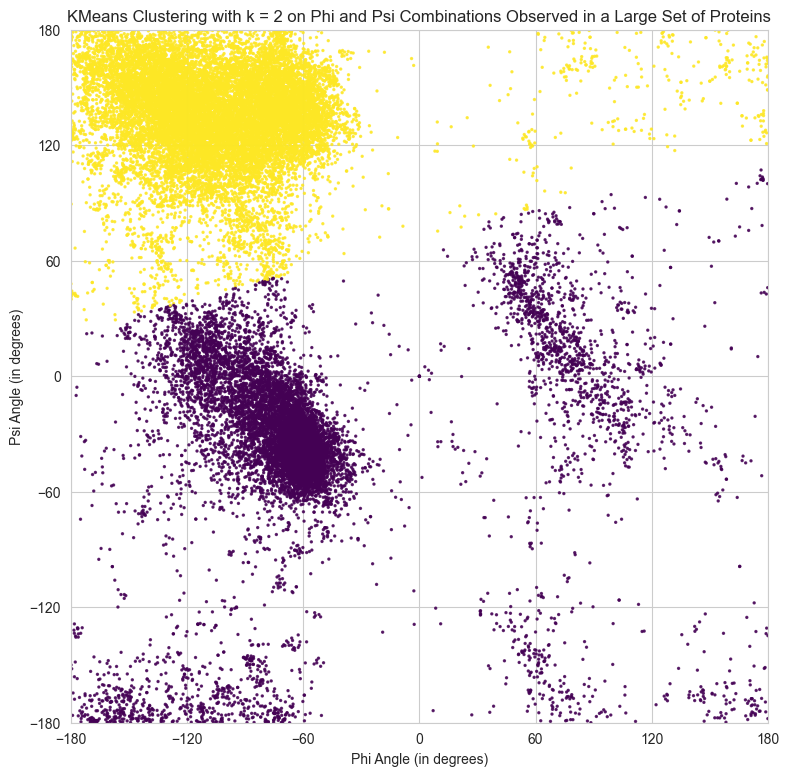

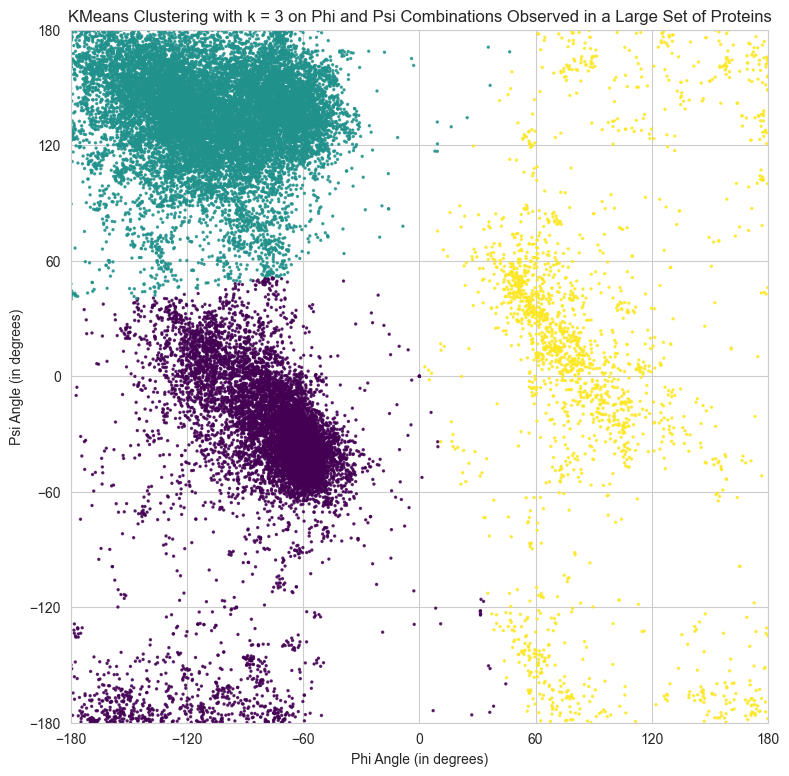

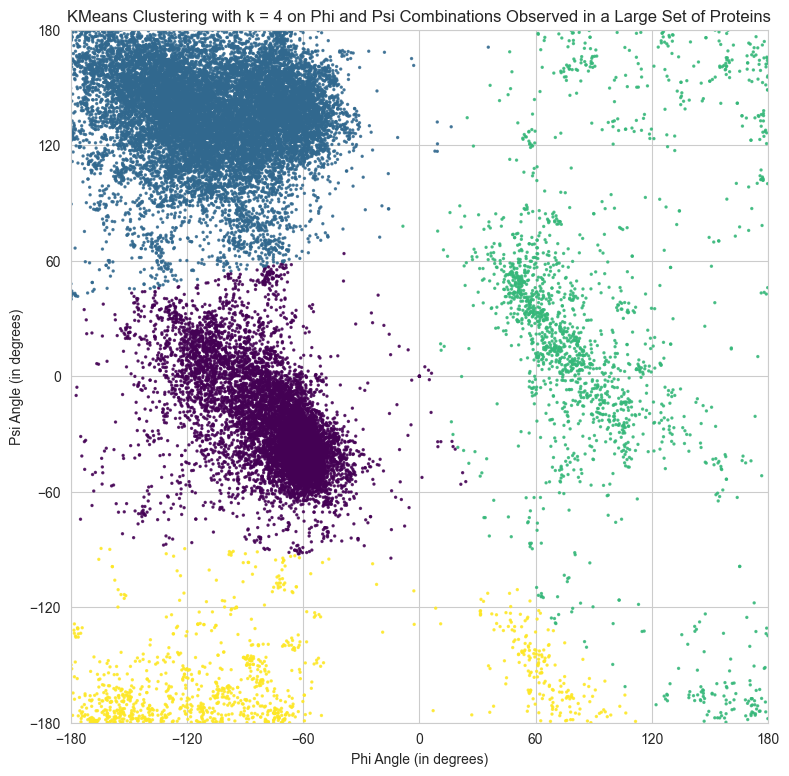

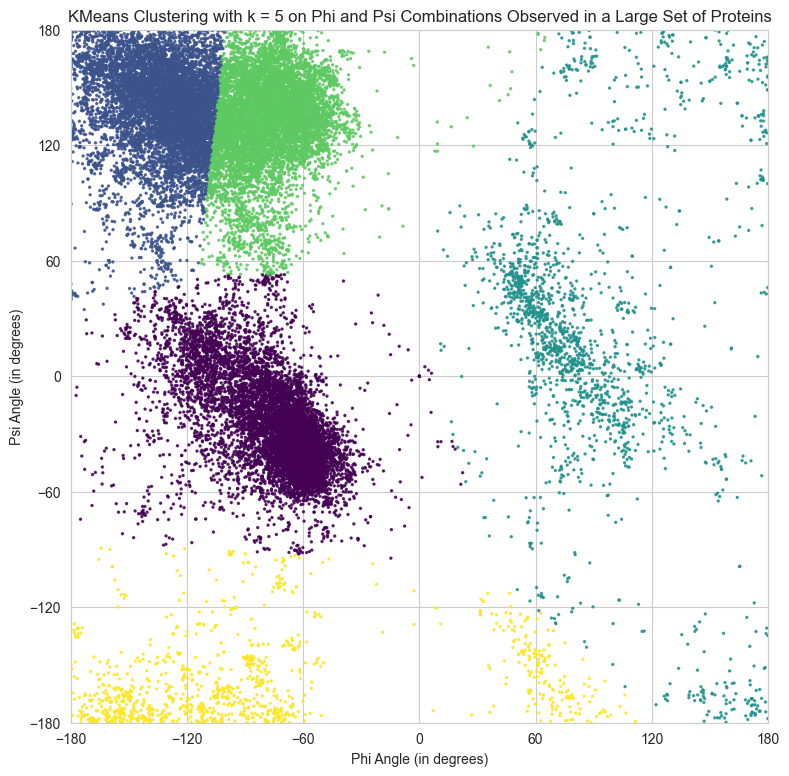

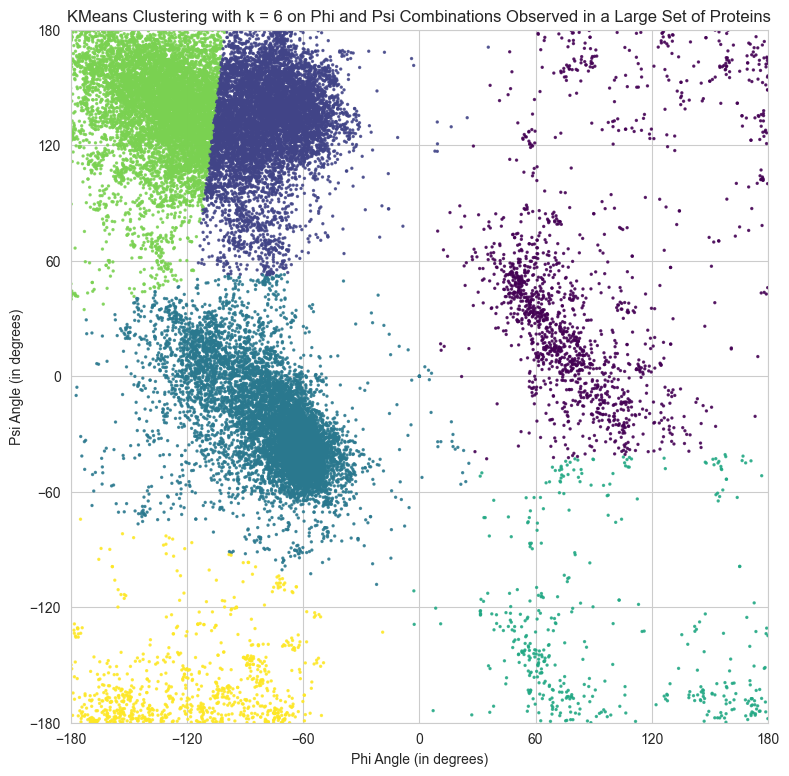

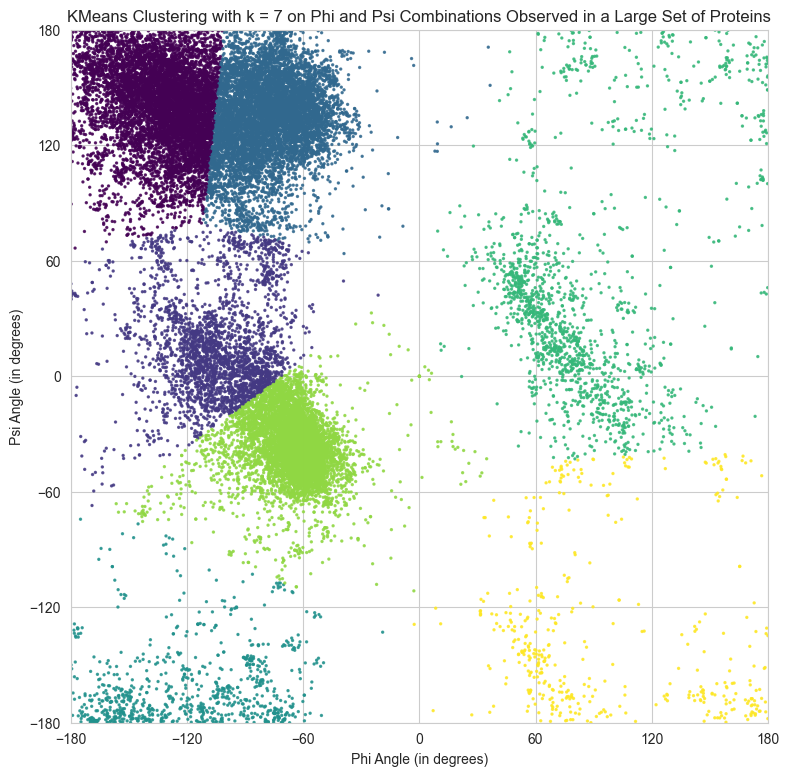

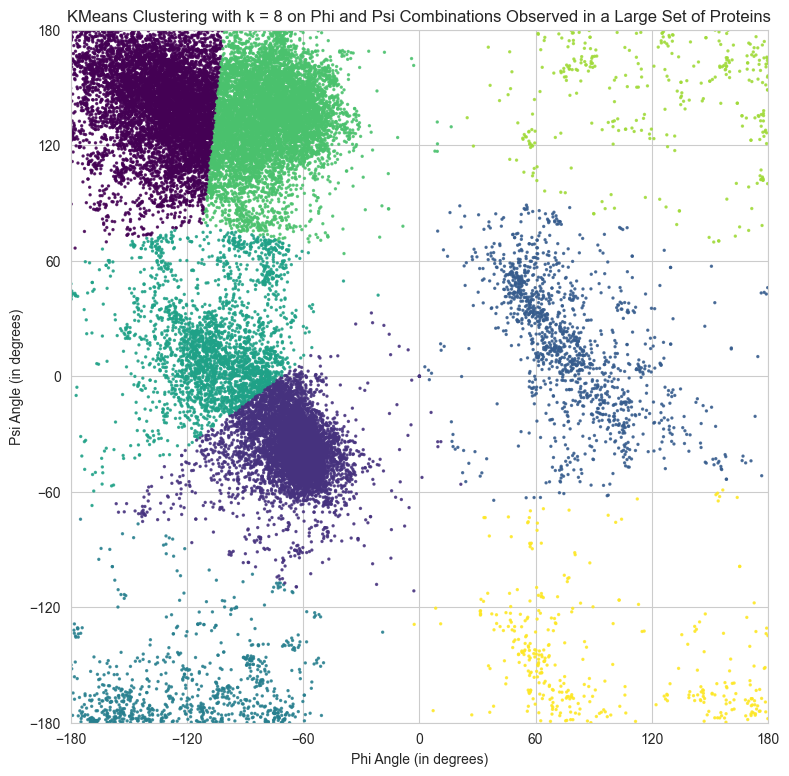

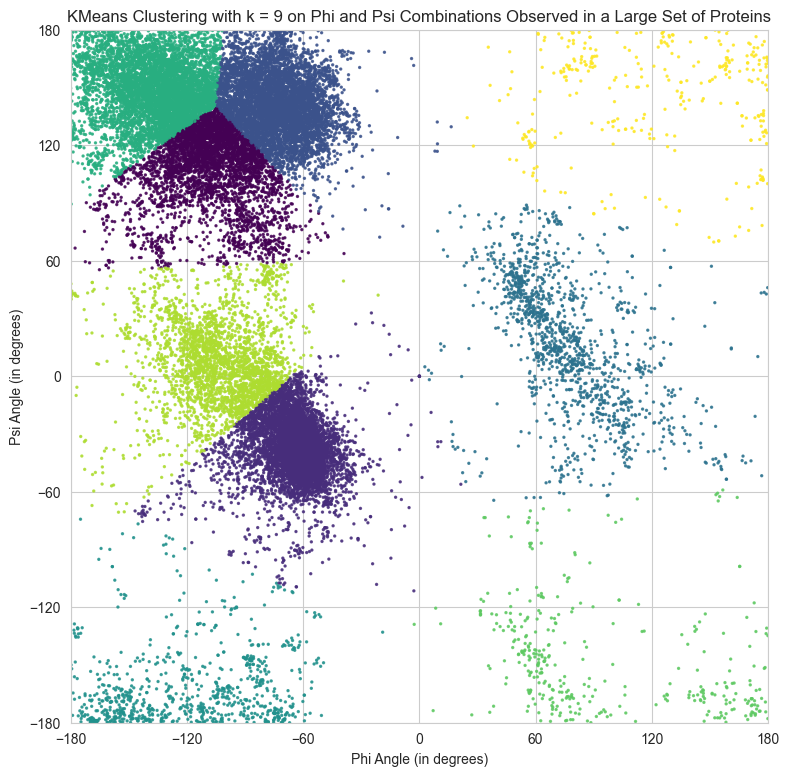

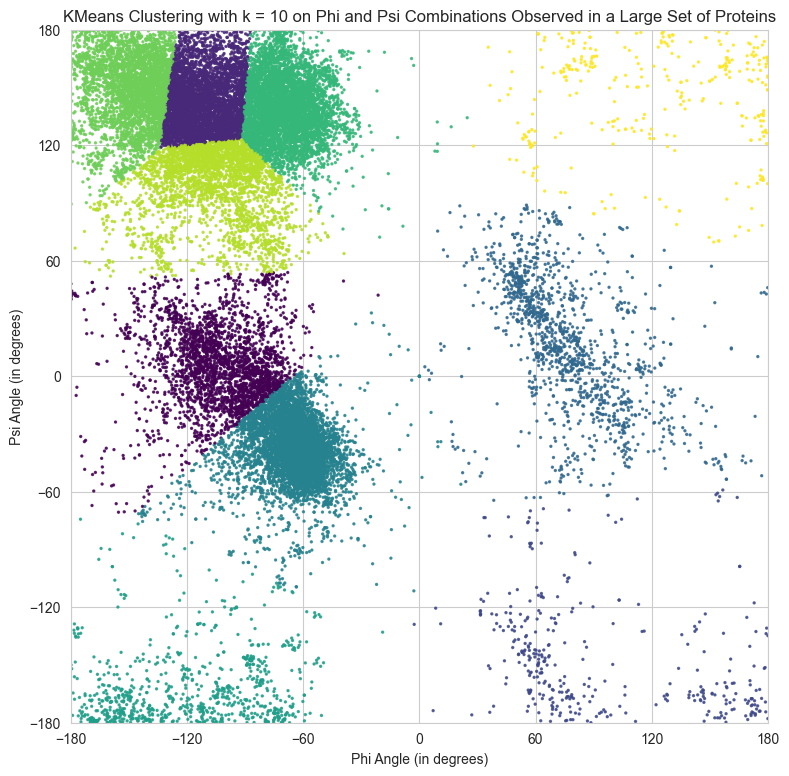

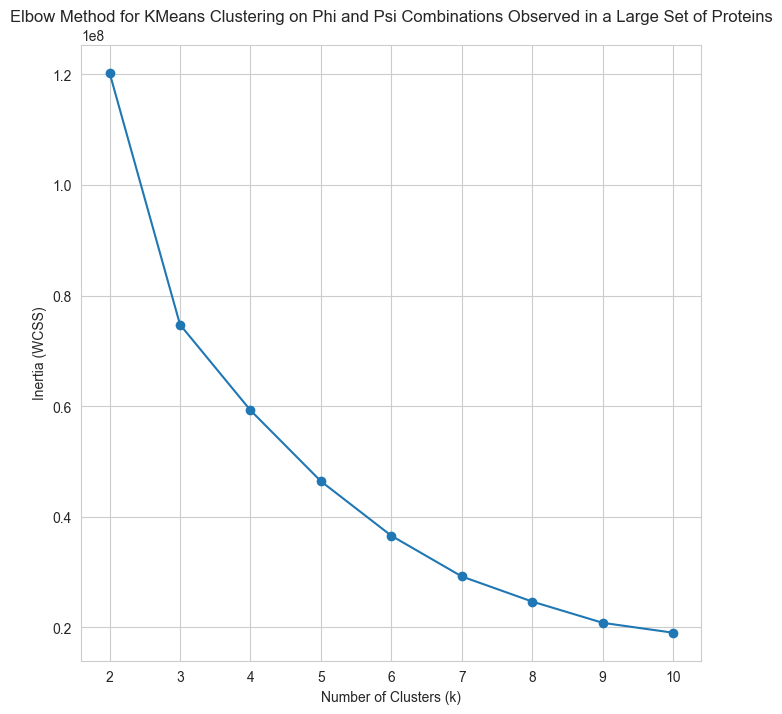

In [13]:
for k in range(2, 11):
    visualise_kmeans(k)

plt.figure(figsize=(8, 8))
plt.plot(range(2, 11), inertia, marker='o')
plt.title('Elbow Method for KMeans Clustering on Phi and Psi Combinations Observed in a Large Set of Proteins')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia (WCSS)')
plt.show()

In [14]:
# Transform to polar coordinates to tackle problem with periodicity
phi = df['phi'].values
psi = df['psi'].values

phi_cos = np.cos(np.radians(phi))
phi_sin = np.sin(np.radians(phi))
psi_cos = np.cos(np.radians(psi))
psi_sin = np.sin(np.radians(psi))

X_polar = np.column_stack((phi_cos, phi_sin, psi_cos, psi_sin))
inertia = []

In [15]:
def visualise_kmeans_polar(k):
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=98)
    kmeans.fit(X_polar)
    y_kmeans = kmeans.predict(X_polar)
    inertia.append(kmeans.inertia_)

    plt.figure(figsize=(9, 9))
    plt.scatter(X['phi'], X['psi'], c=y_kmeans, s=2, alpha=0.8, cmap='viridis')
    plt.xlim(-180, 180)
    plt.ylim(-180, 180)
    plt.xticks(range(-180, 181, 60))
    plt.yticks(range(-180, 181, 60))
    plt.xlabel('Phi Angle (in degrees)')
    plt.ylabel('Psi Angle (in degrees)')

    plt.title(f'KMeans Clustering with k = {k} based on Phi and Psi Polar Coordinates Observed in a Large Set of Proteins')
    plt.show()

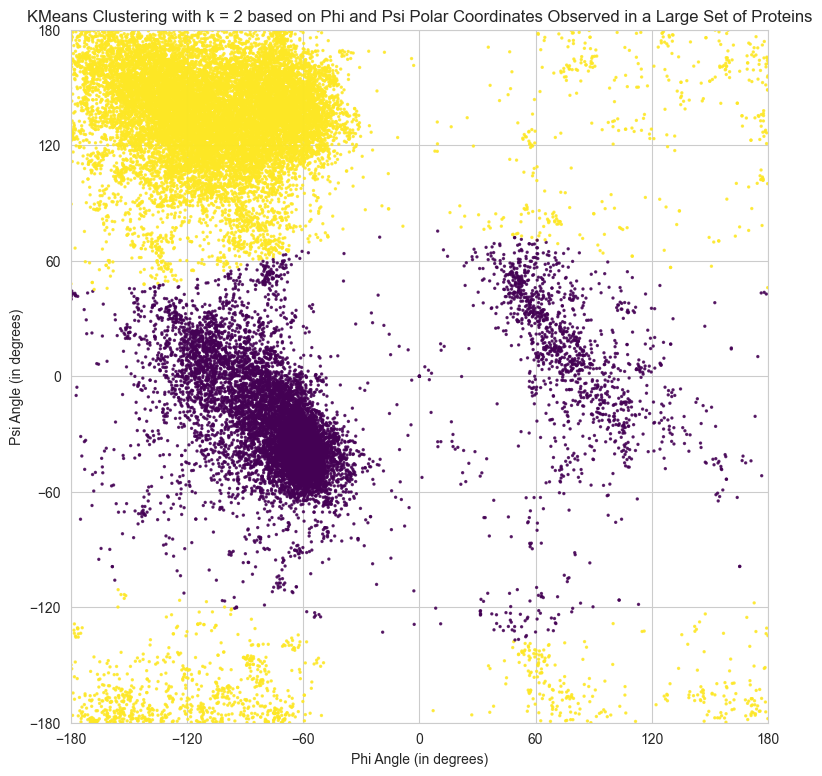

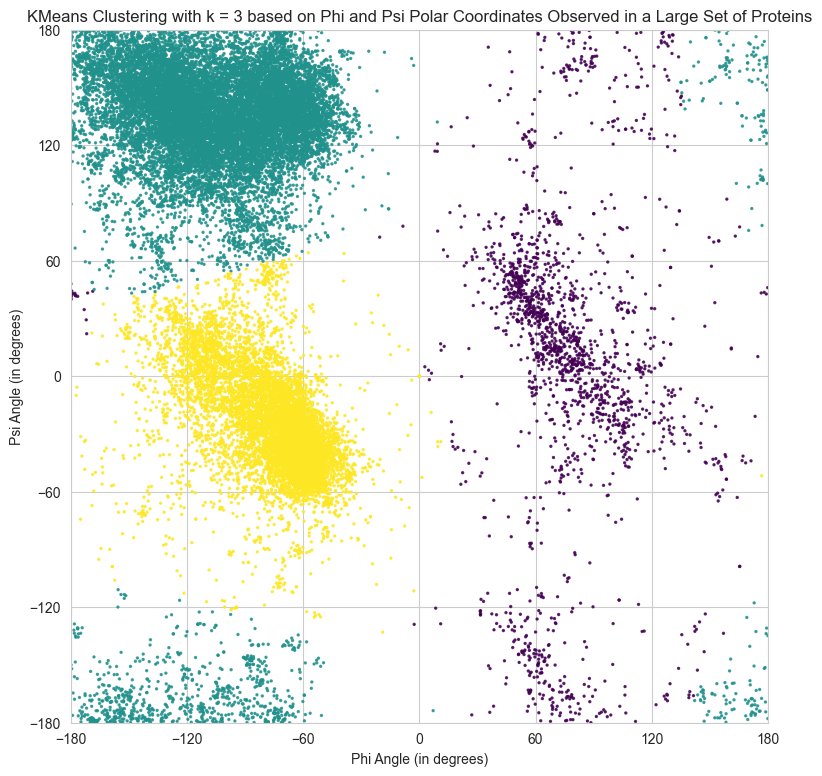

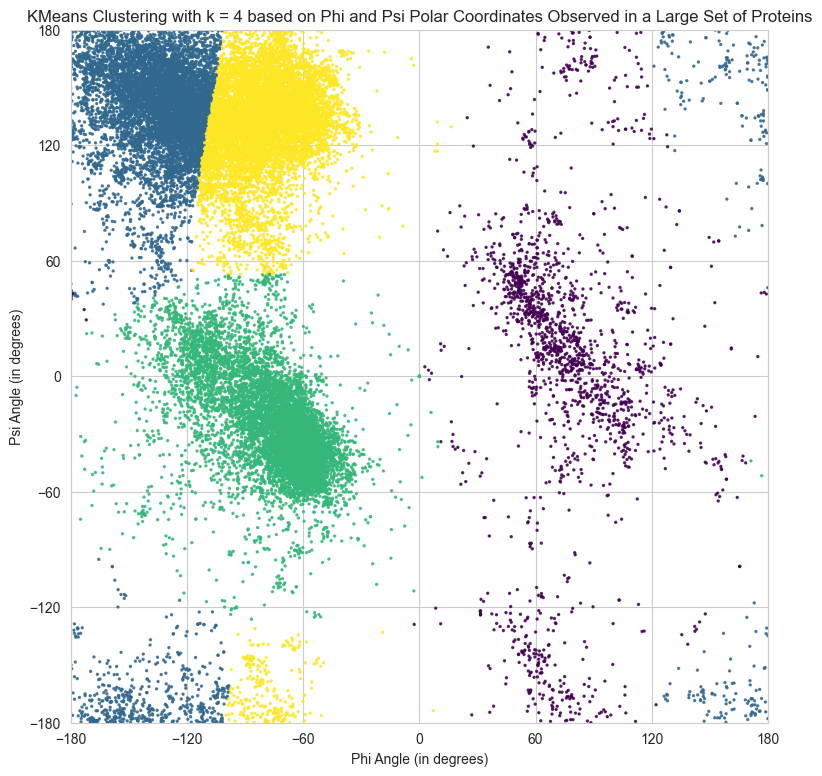

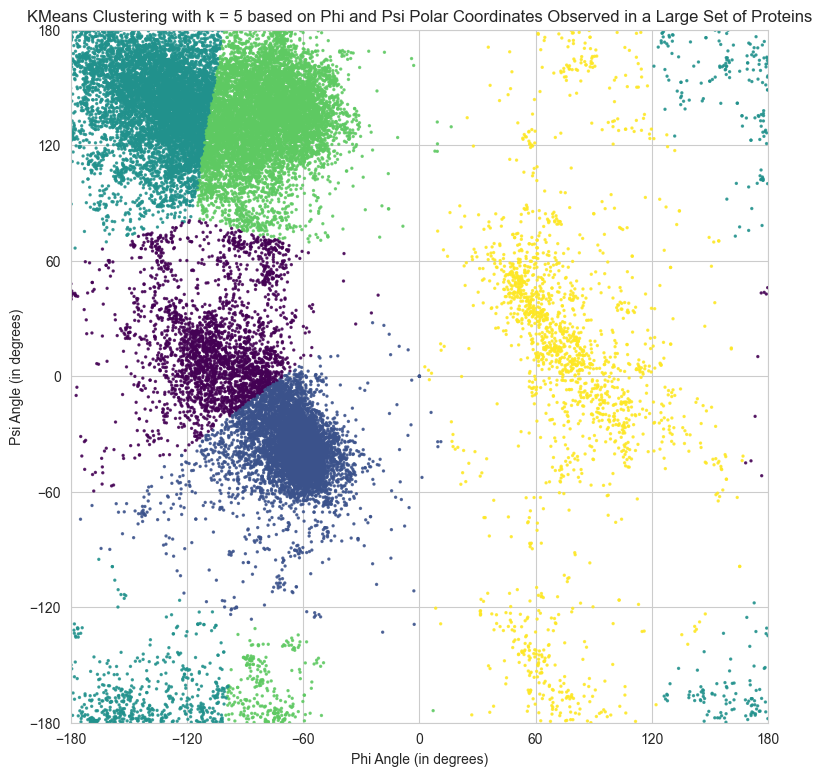

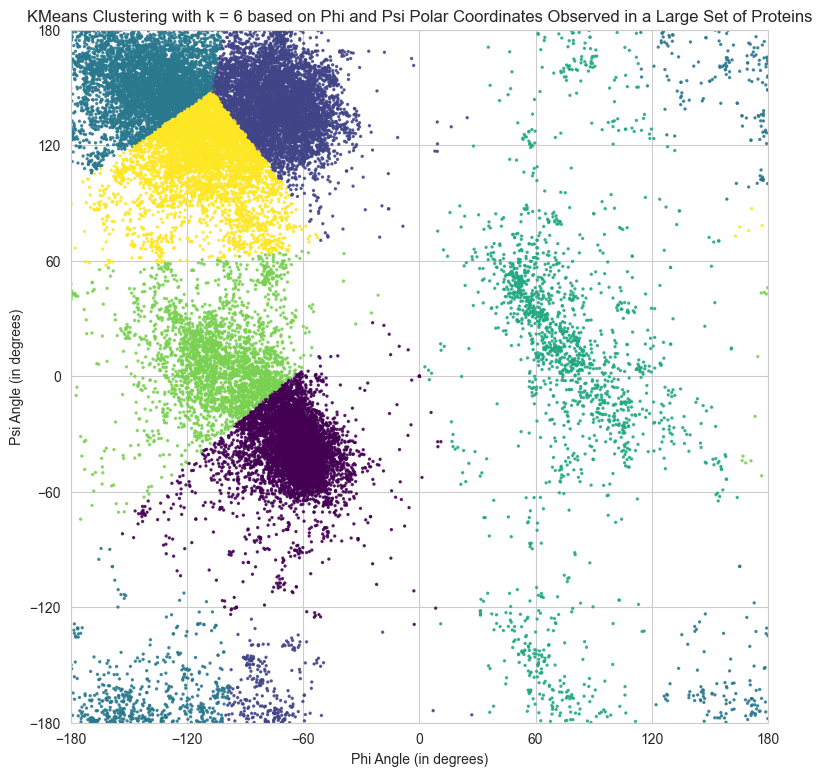

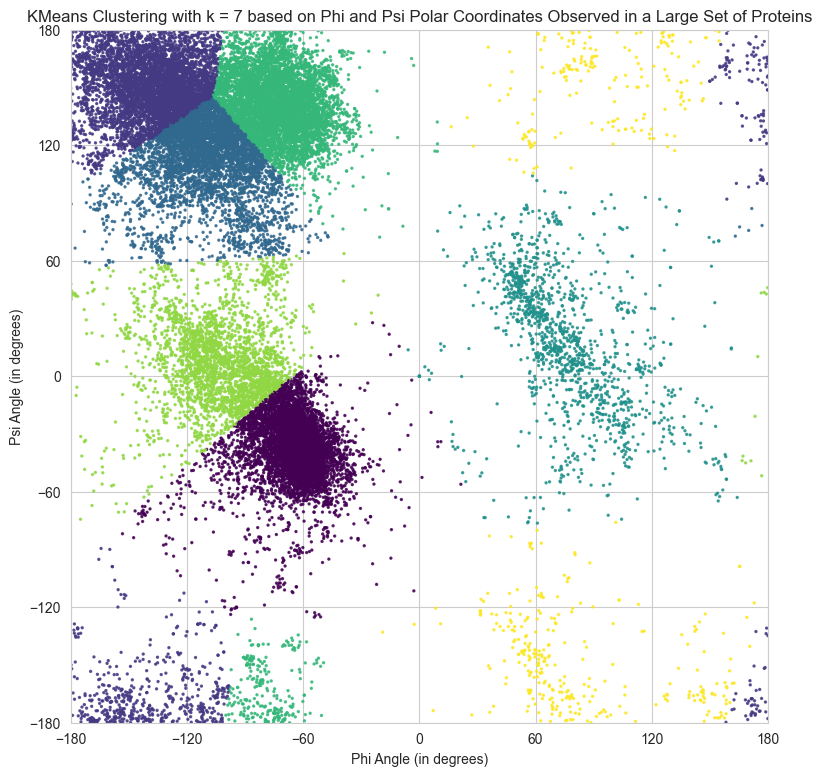

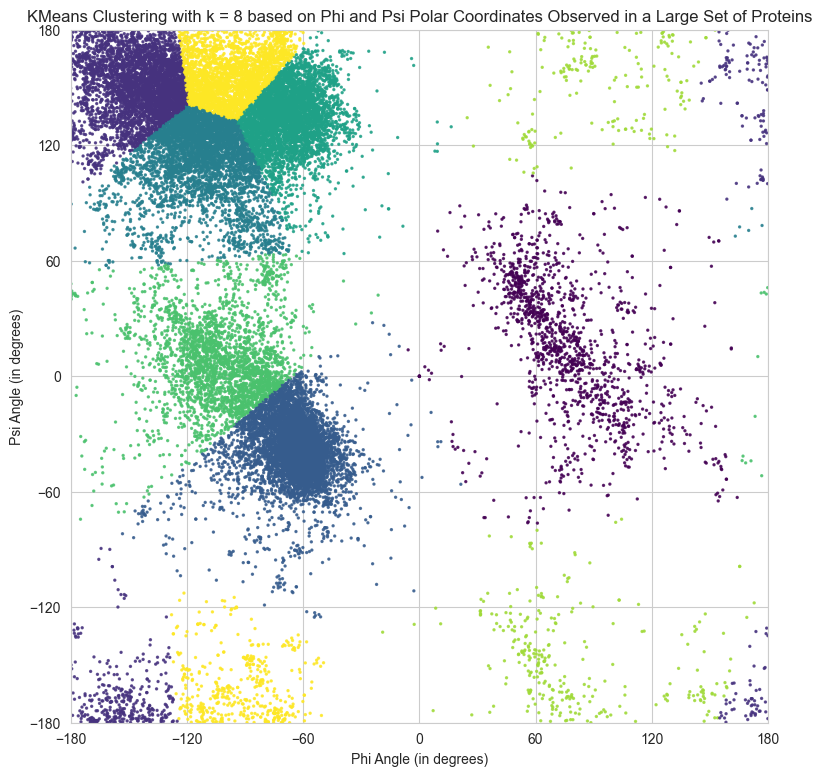

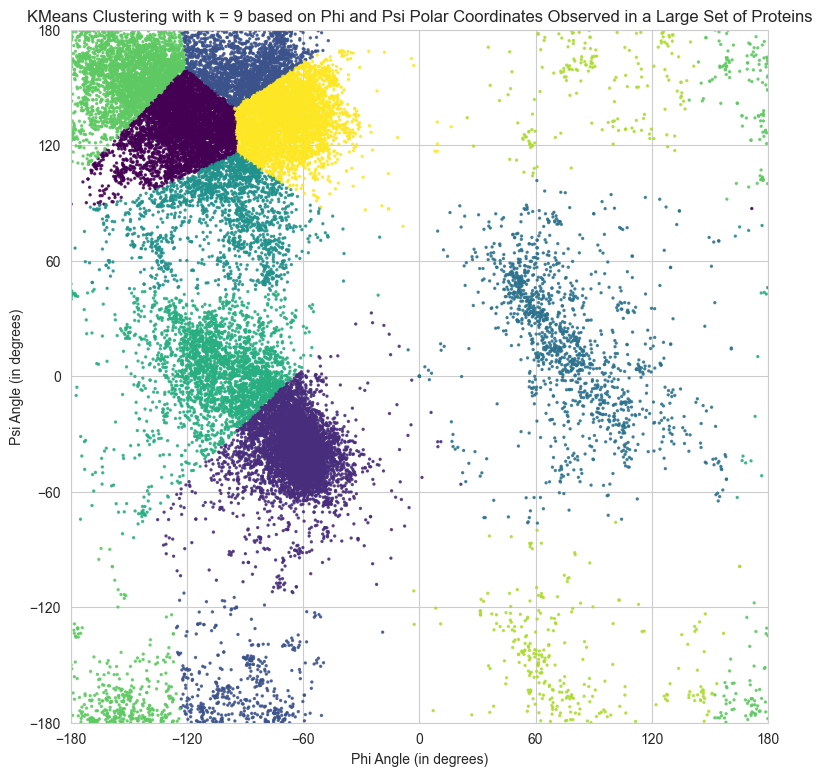

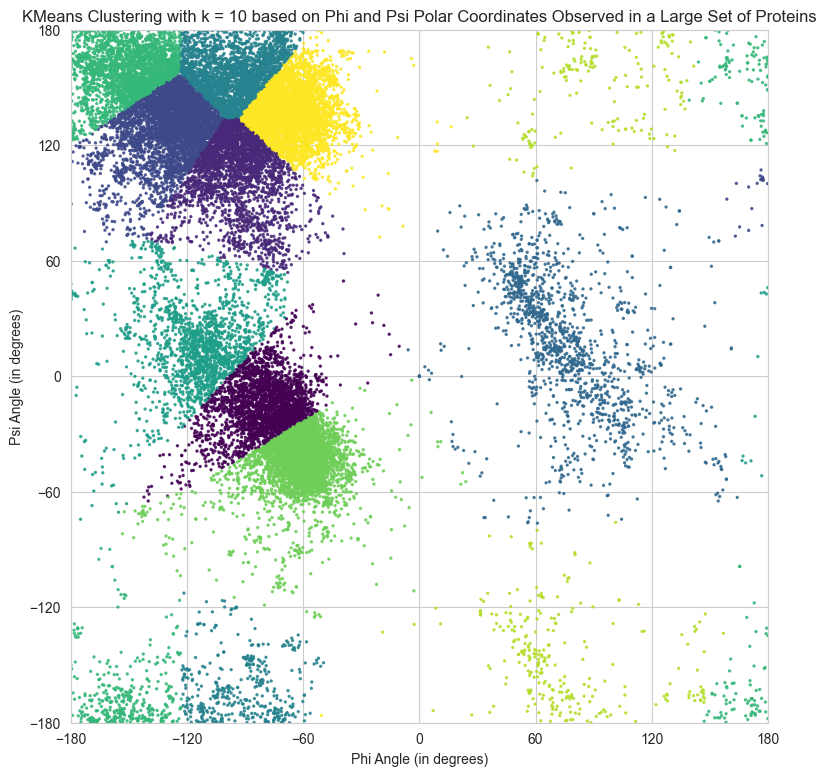

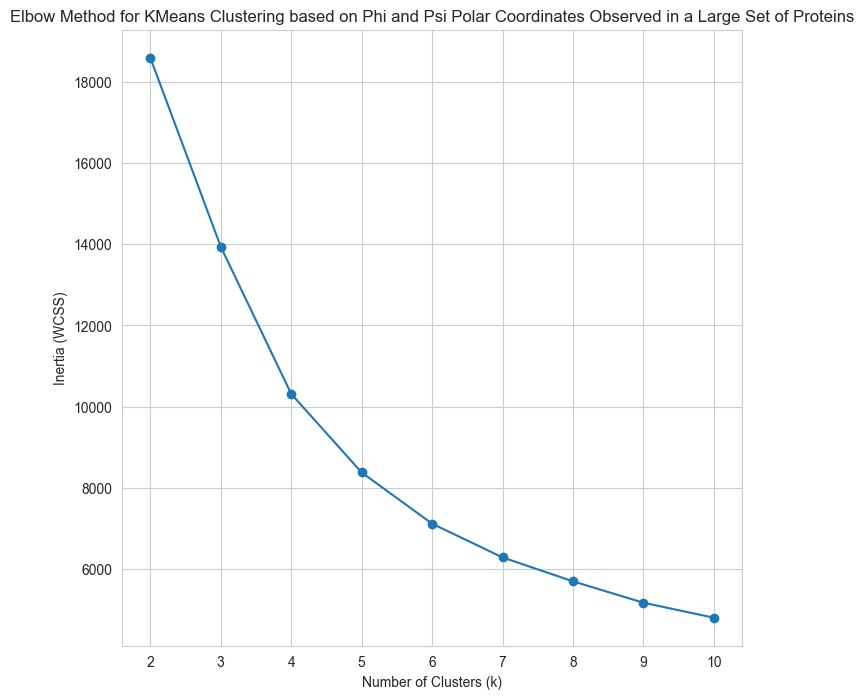

In [16]:
for k in range(2, 11):
    visualise_kmeans_polar(k)

plt.figure(figsize=(8, 8))
plt.plot(range(2, 11), inertia, marker='o')
plt.title('Elbow Method for KMeans Clustering based on Phi and Psi Polar Coordinates Observed in a Large Set of Proteins')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia (WCSS)')
plt.show()

### **Task 3: Use the DBSCAN method to cluster the phi and psi angle combinations in the data file.**

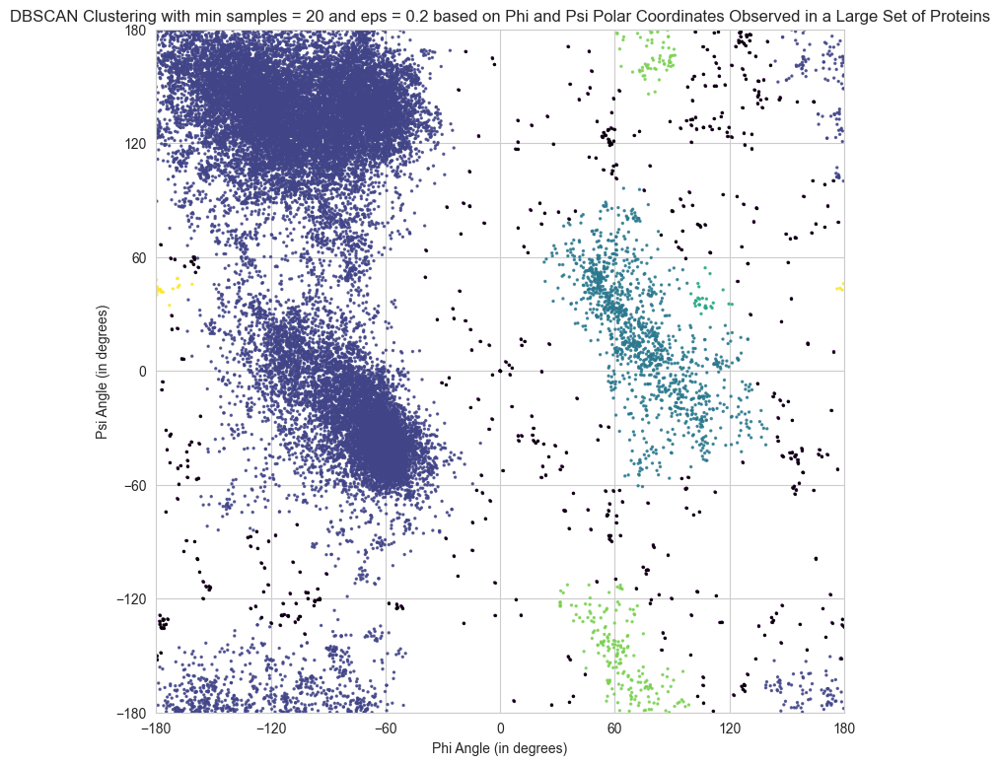

Number of clusters: 5
Number of outliers: 519


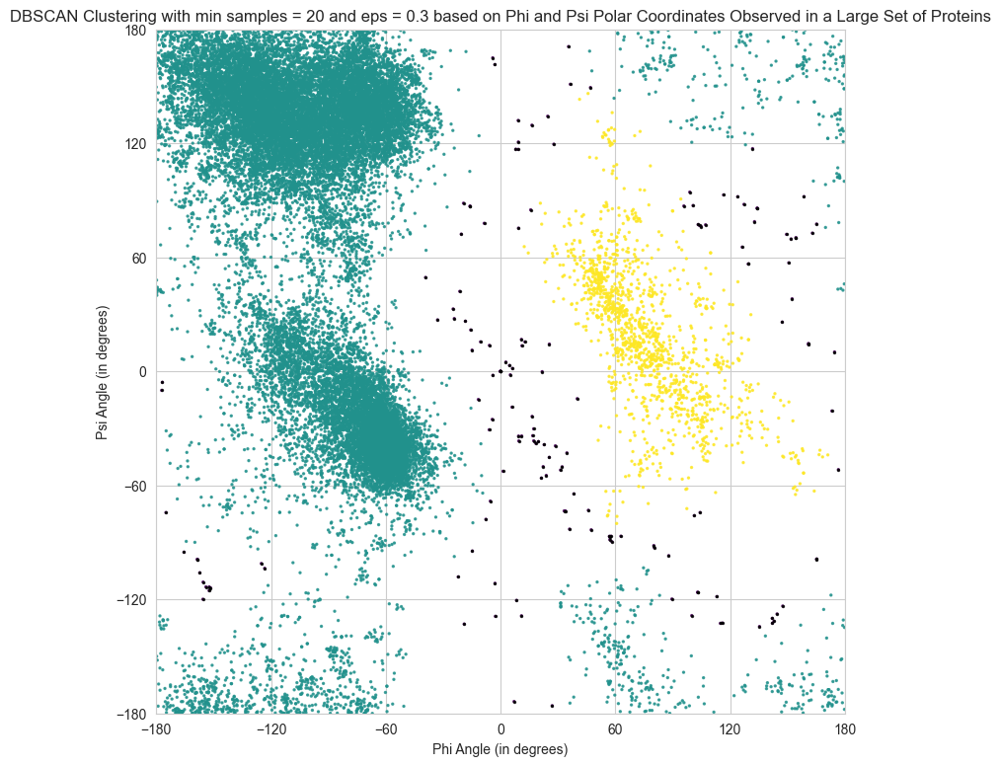

Number of clusters: 2
Number of outliers: 158


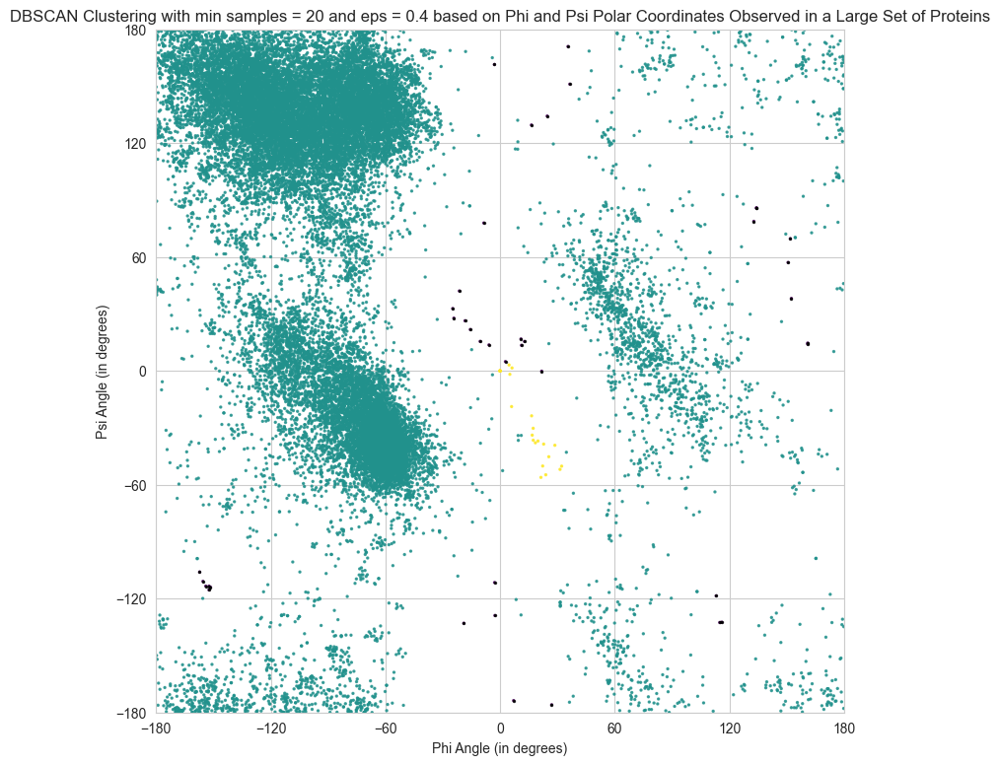

Number of clusters: 2
Number of outliers: 40


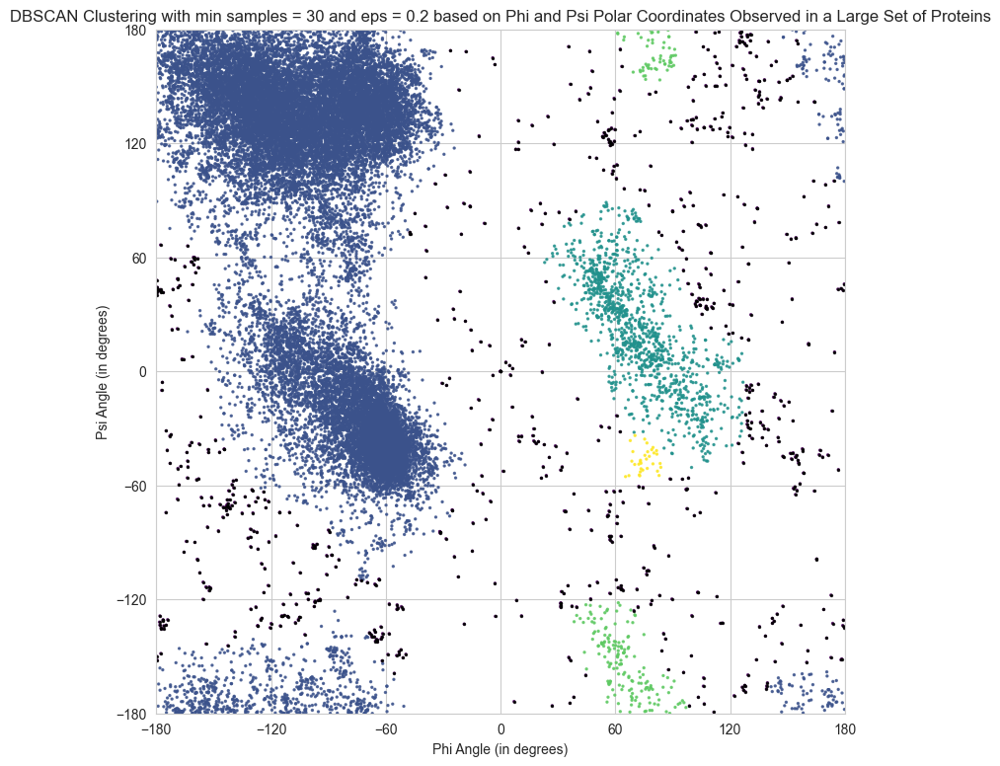

Number of clusters: 4
Number of outliers: 779


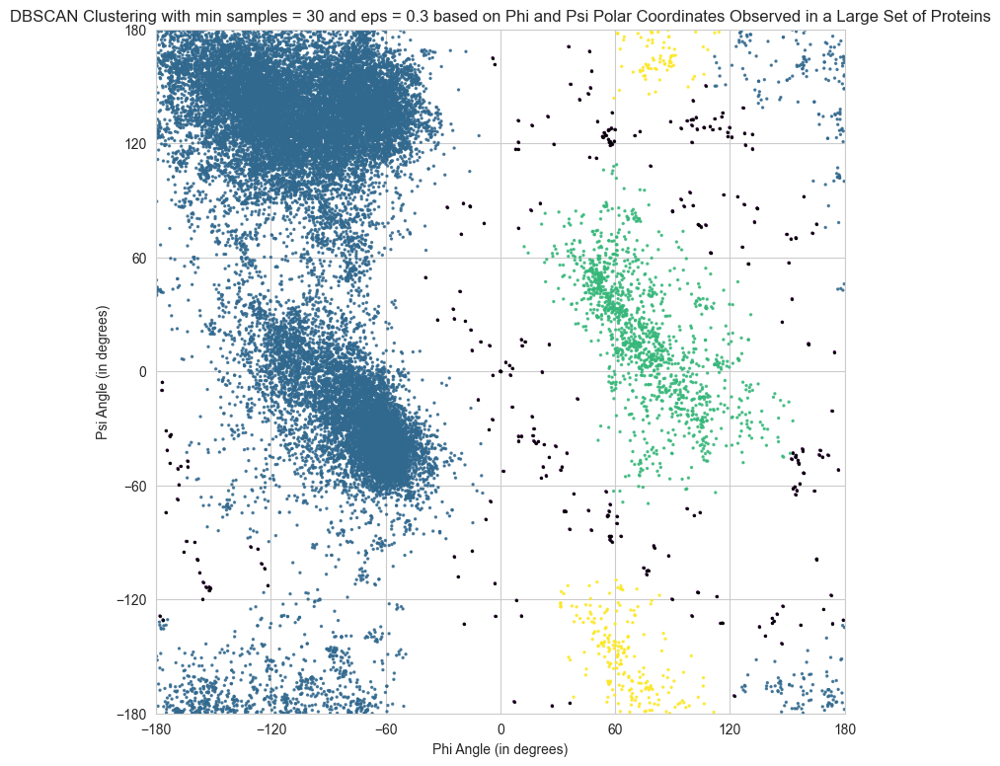

Number of clusters: 3
Number of outliers: 280


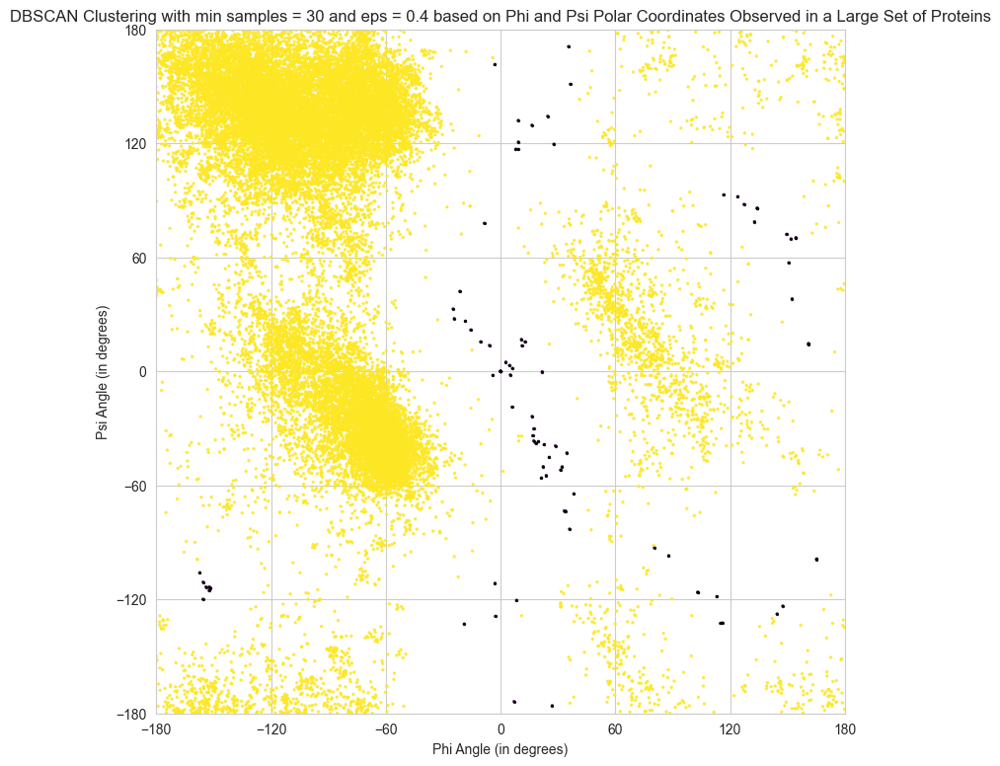

Number of clusters: 1
Number of outliers: 90


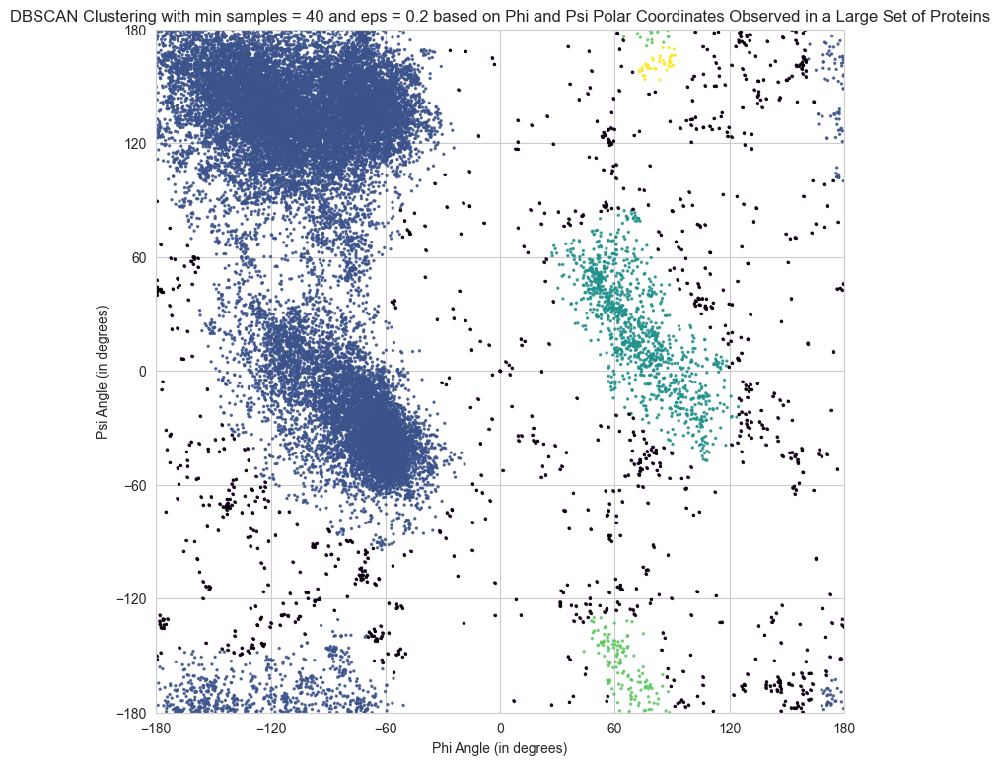

Number of clusters: 4
Number of outliers: 1037


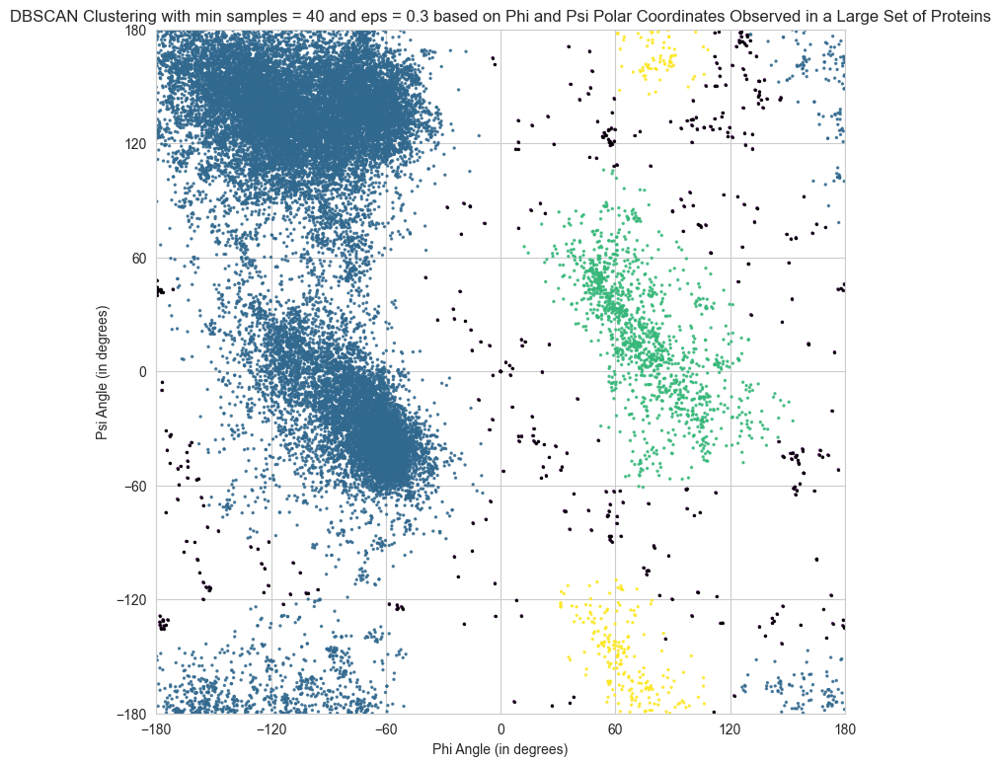

Number of clusters: 3
Number of outliers: 400


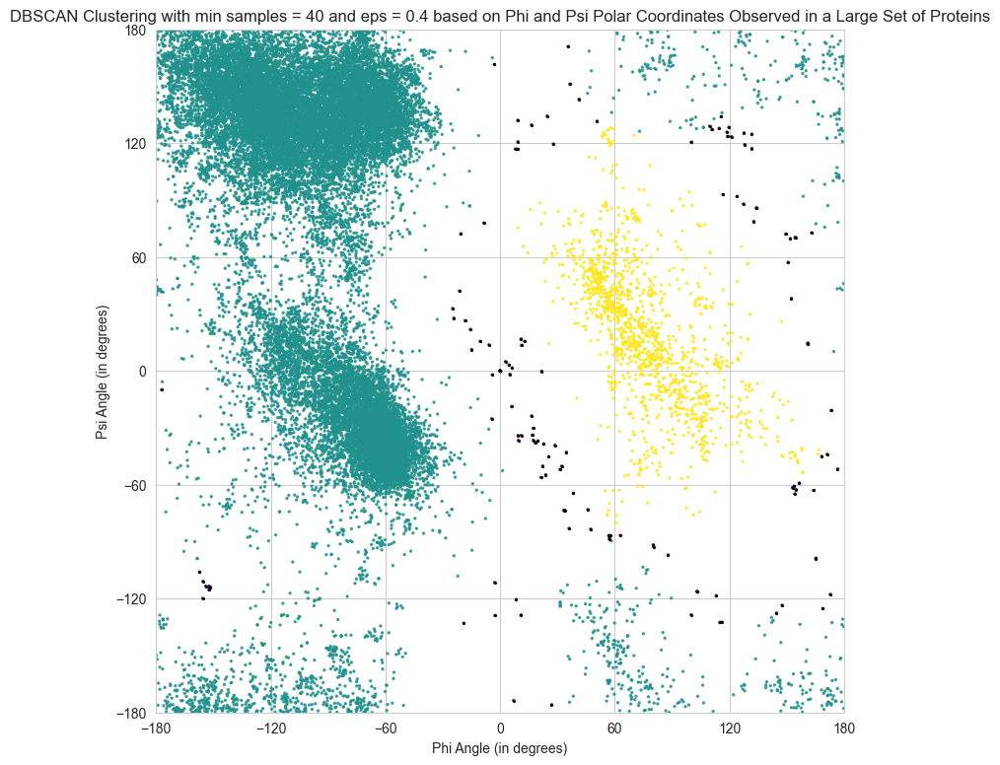

Number of clusters: 2
Number of outliers: 135


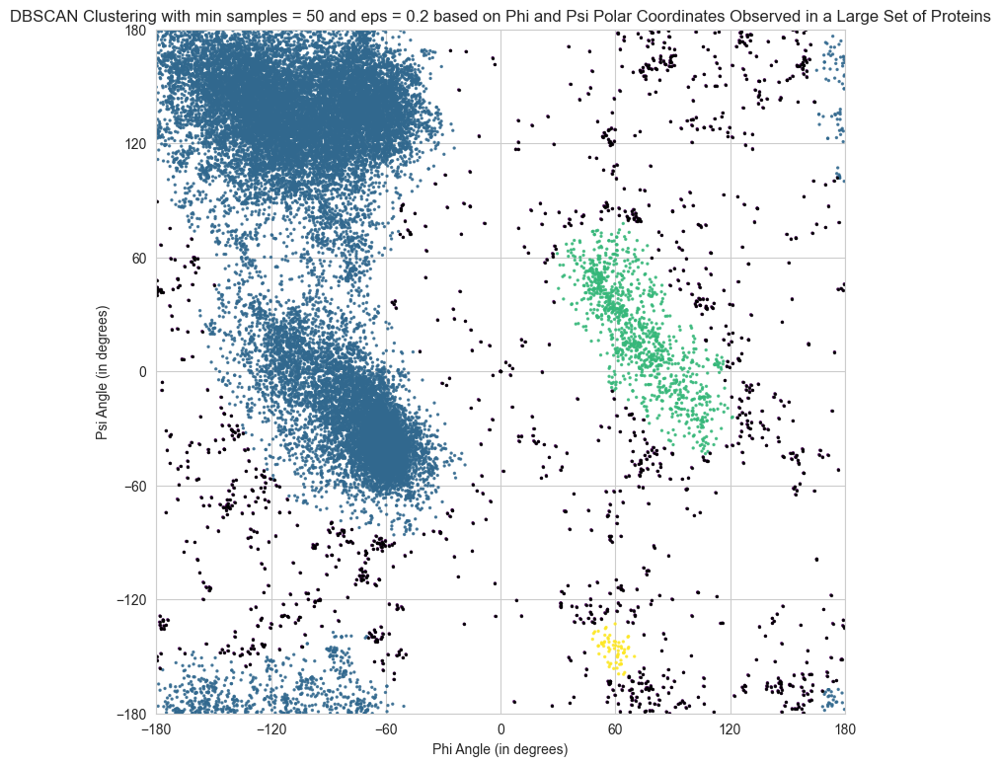

Number of clusters: 3
Number of outliers: 1295


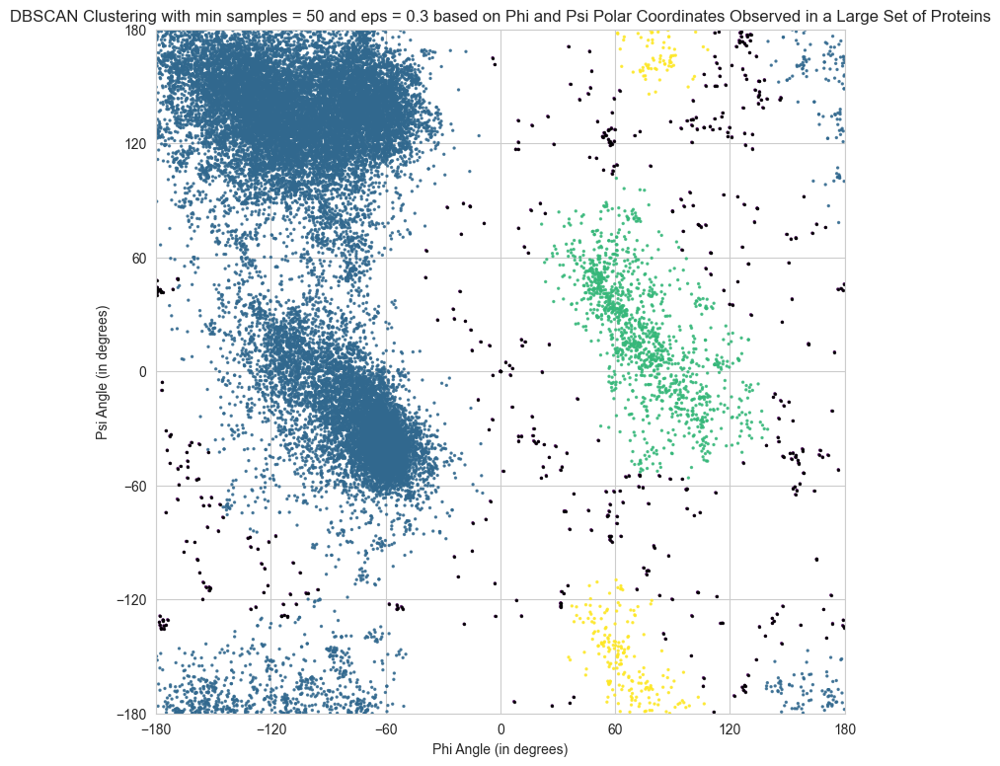

Number of clusters: 3
Number of outliers: 474


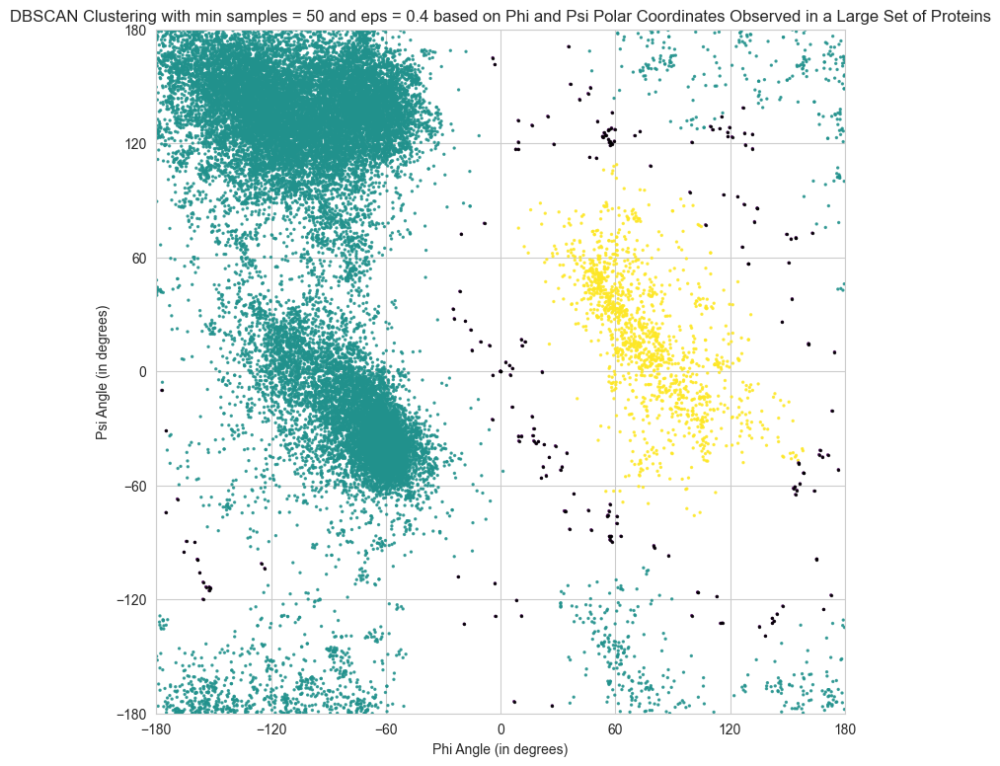

Number of clusters: 2
Number of outliers: 197


In [17]:
# Performing DBSCAN for different values of min_samples and eps on phi and psi polar coordinates data
for min_samples in [20, 30, 40, 50]:
    for eps in [0.2, 0.3, 0.4]:
        db = DBSCAN(eps=eps, min_samples=min_samples)
        y_db = db.fit_predict(X_polar)

        core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
        core_samples_mask[db.core_sample_indices_] = True
        labels = db.labels_

        num_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        num_outliers = list(labels).count(-1)

        plt.figure(figsize=(9, 9))
        plt.scatter(X['phi'], X['psi'], c=y_db, cmap='viridis', s=2, alpha=0.8)

        outliers_mask = labels == -1
        plt.scatter(X['phi'][outliers_mask], X['psi'][outliers_mask], c='black', s=2, alpha=0.8)

        plt.xlim(-180, 180)
        plt.ylim(-180, 180)
        plt.xticks(range(-180, 181, 60))
        plt.yticks(range(-180, 181, 60))
        plt.xlabel('Phi Angle (in degrees)')
        plt.ylabel('Psi Angle (in degrees)')

        plt.title(f'DBSCAN Clustering with min samples = {min_samples} and eps = {eps} based on Phi and Psi Polar Coordinates Observed in a Large Set of Proteins')
        plt.show()

        print(f'Number of clusters: {num_clusters}')
        print(f'Number of outliers: {num_outliers}')

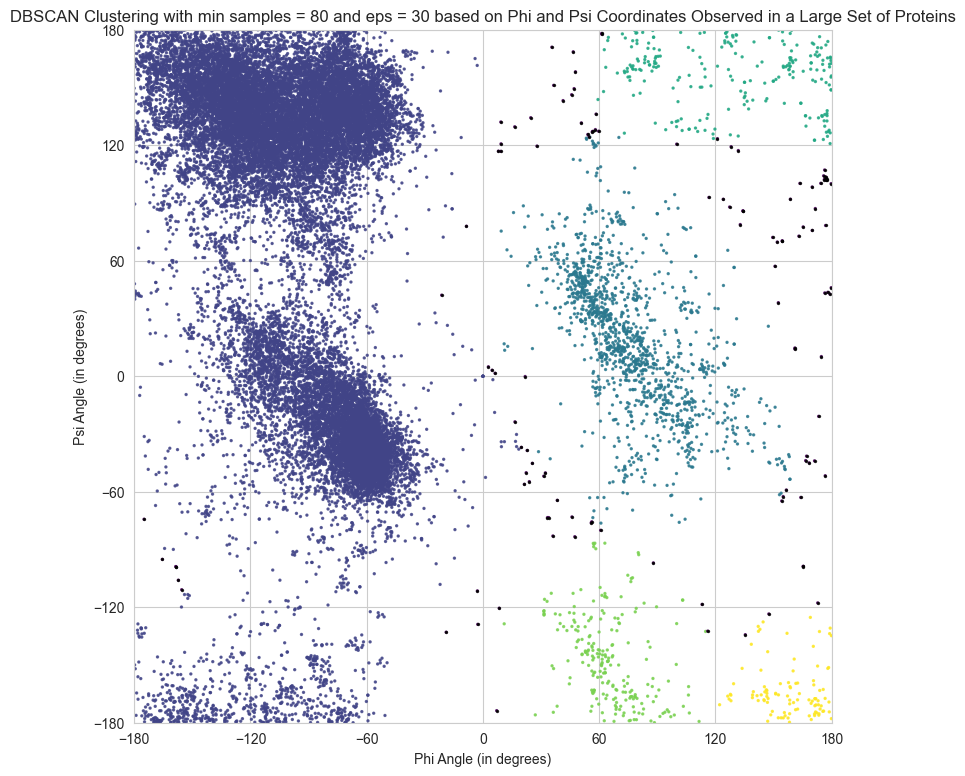

Number of clusters: 5
Number of outliers: 119


In [18]:
# Performing DBSCAN on the original data
db = DBSCAN(eps=30, min_samples=80)
y_db = db.fit_predict(X)

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

num_clusters = len(set(labels)) - (1 if -1 in labels else 0)
num_outliers = list(labels).count(-1)

plt.figure(figsize=(9, 9))
plt.scatter(X['phi'], X['psi'], c=y_db, cmap='viridis', s=2, alpha=0.8)

outliers_mask = labels == -1
plt.scatter(X['phi'][outliers_mask], X['psi'][outliers_mask], c='black', s=2, alpha=0.8)

plt.xlim(-180, 180)
plt.ylim(-180, 180)
plt.xticks(range(-180, 181, 60))
plt.yticks(range(-180, 181, 60))
plt.xlabel('Phi Angle (in degrees)')
plt.ylabel('Psi Angle (in degrees)')

plt.title(f'DBSCAN Clustering with min samples = 80 and eps = 30 based on Phi and Psi Coordinates Observed in a Large Set of Proteins')
plt.show()

print(f'Number of clusters: {num_clusters}')
print(f'Number of outliers: {num_outliers}')

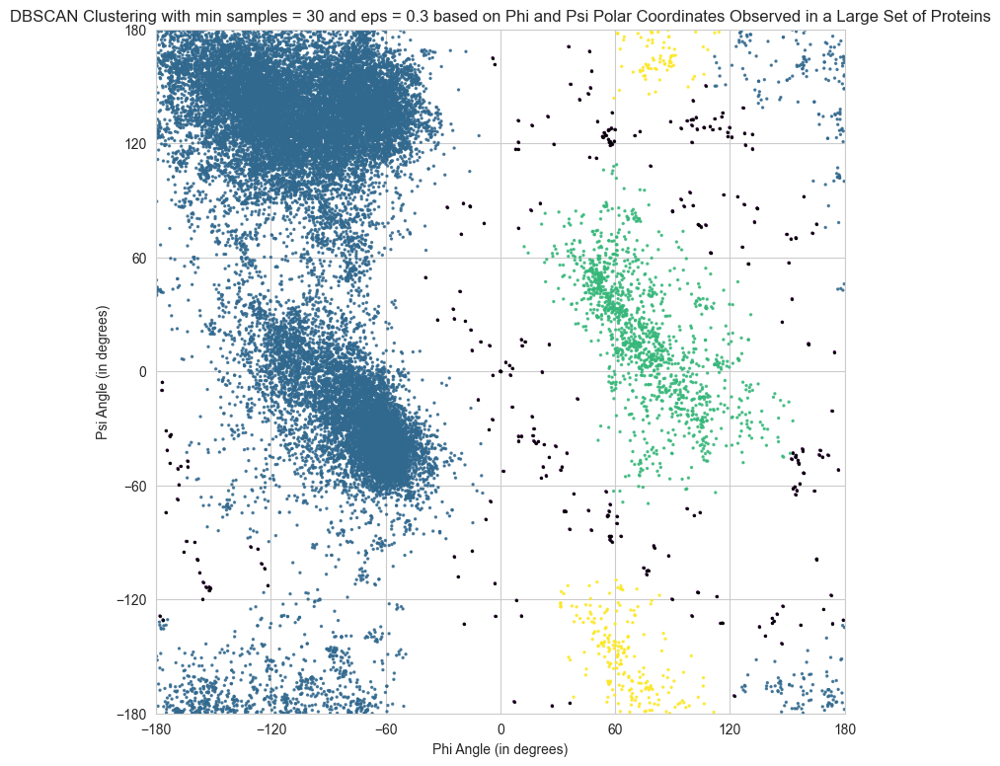

Number of clusters: 3
Number of outliers: 280


In [19]:
# Chosen plot for (c)
db = DBSCAN(eps=0.3, min_samples=30)
y_db = db.fit_predict(X_polar)

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

num_clusters = len(set(labels)) - (1 if -1 in labels else 0)
num_outliers = list(labels).count(-1)

plt.figure(figsize=(9, 9))
plt.scatter(X['phi'], X['psi'], c=y_db, cmap='viridis', s=2, alpha=0.8)

outliers_mask = labels == -1
plt.scatter(X['phi'][outliers_mask], X['psi'][outliers_mask], c='black', s=2, alpha=0.8)

plt.xlim(-180, 180)
plt.ylim(-180, 180)
plt.xticks(range(-180, 181, 60))
plt.yticks(range(-180, 181, 60))
plt.xlabel('Phi Angle (in degrees)')
plt.ylabel('Psi Angle (in degrees)')

plt.title(f'DBSCAN Clustering with min samples = 30 and eps = 0.3 based on Phi and Psi Polar Coordinates Observed in a Large Set of Proteins')
plt.show()

print(f'Number of clusters: {num_clusters}')
print(f'Number of outliers: {num_outliers}')

In [20]:
X_residue = df[['residue name', 'phi', 'psi']].copy()
X_residue['label'] = y_db
outliers = X_residue[X_residue['label'] == -1]

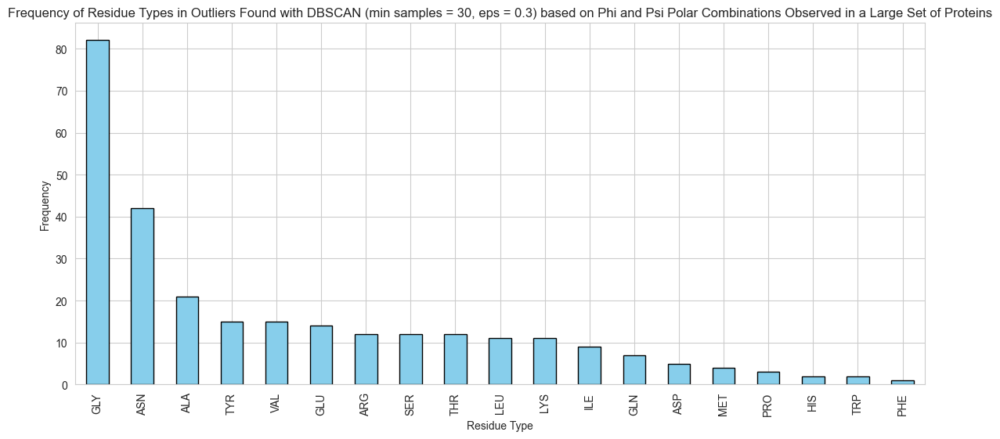

In [21]:
residue_counts = outliers['residue name'].value_counts()

plt.figure(figsize=(14, 6))
residue_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Frequency of Residue Types in Outliers Found with DBSCAN (min samples = 30, eps = 0.3) based on Phi and Psi Polar Combinations Observed in a Large Set of Proteins')
plt.xlabel('Residue Type')
plt.ylabel('Frequency')
plt.show()

### **Task 4: The data file can be stratified by amino acid residue type. Use DBSCAN to cluster the data that have residue type PRO. Investigate how the clusters found for amino acid residues of type PRO differ from the general clusters.**

In [22]:
X_residue_pro = df[['residue name', 'phi', 'psi']].copy()
X_residue_pro = X_residue_pro[X_residue_pro['residue name'] == 'PRO']

In [23]:
print(f'The number of rows with residue type PRO is: {len(X_residue_pro)}')

The number of rows with residue type PRO is: 1596


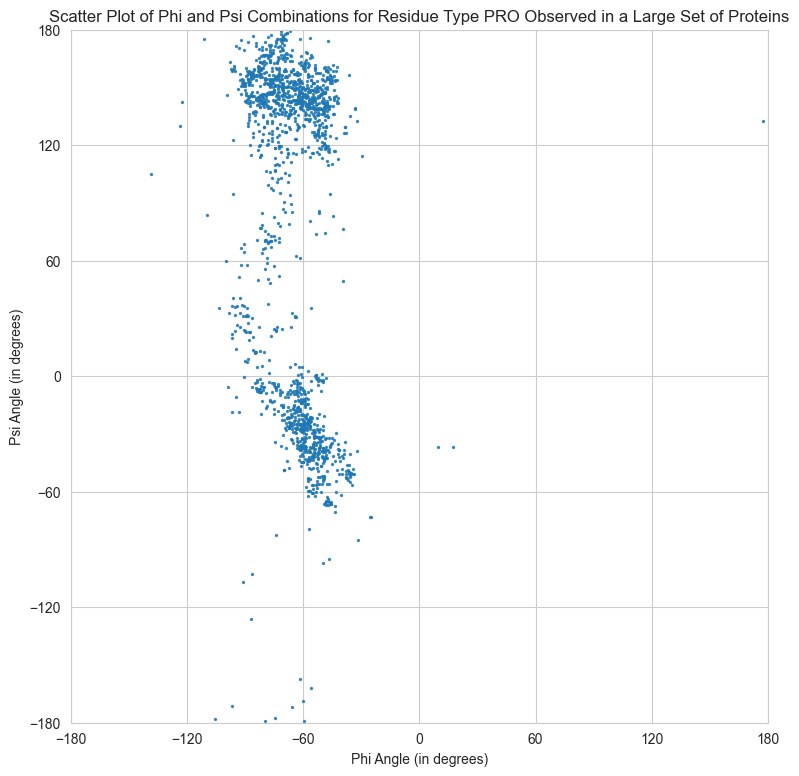

In [24]:
# Draw scatter plot of the data
plt.figure(figsize=(9, 9))
plt.scatter(X_residue_pro['phi'], X_residue_pro['psi'], s=2, alpha=0.8)
plt.xlim(-180, 180)
plt.ylim(-180, 180)
plt.xticks(range(-180, 181, 60))
plt.yticks(range(-180, 181, 60))
plt.xlabel('Phi Angle (in degrees)')
plt.ylabel('Psi Angle (in degrees)')

plt.title('Scatter Plot of Phi and Psi Combinations for Residue Type PRO Observed in a Large Set of Proteins')
plt.show()

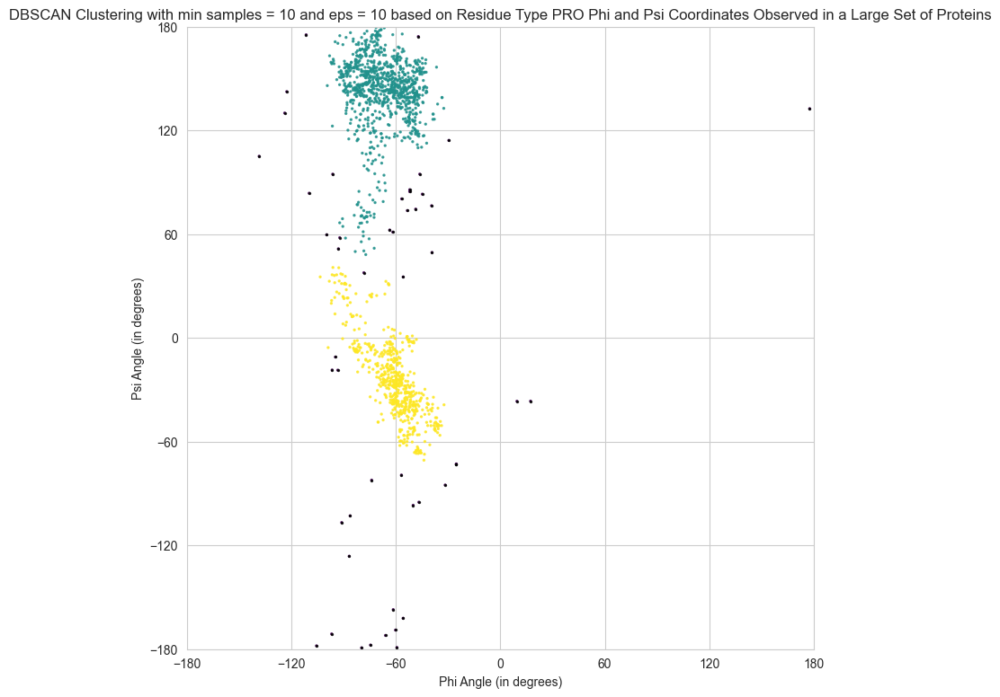

Number of clusters: 2
Number of outliers: 49


In [25]:
X_residue_pro_coordinates = X_residue_pro[['phi', 'psi']].copy()
db_residue = DBSCAN(eps=10, min_samples=10)
y_db_pro = db_residue.fit_predict(X_residue_pro_coordinates)

core_samples_mask = np.zeros_like(db_residue.labels_, dtype=bool)
core_samples_mask[db_residue.core_sample_indices_] = True
labels = db_residue.labels_

num_clusters = len(set(labels)) - (1 if -1 in labels else 0)
num_outliers = list(labels).count(-1)

plt.figure(figsize=(9, 9))
plt.scatter(X_residue_pro['phi'], X_residue_pro['psi'], c=y_db_pro, cmap='viridis', s=2, alpha=0.8)

outliers_mask = labels == -1
plt.scatter(X_residue_pro['phi'][outliers_mask], X_residue_pro['psi'][outliers_mask], c='black', s=2, alpha=0.8)

plt.xlim(-180, 180)
plt.ylim(-180, 180)
plt.xticks(range(-180, 181, 60))
plt.yticks(range(-180, 181, 60))
plt.xlabel('Phi Angle (in degrees)')
plt.ylabel('Psi Angle (in degrees)')

plt.title(f'DBSCAN Clustering with min samples = 10 and eps = 10 based on Residue Type PRO Phi and Psi Coordinates Observed in a Large Set of Proteins')
plt.show()

print(f'Number of clusters: {num_clusters}')
print(f'Number of outliers: {num_outliers}')